In [1]:
# import necessary libraries
import pickle as pk
from pathlib import Path

import matplotlib.pyplot as plt
import mne
import numpy as np
import pandas as pd
from rich import inspect, pretty, print

pretty.install()


out_dir = "../data/preprocessing/viz/"
data_dir = "../data/preprocessing/"
Path(out_dir).mkdir(parents=True, exist_ok=True)
Path(data_dir).mkdir(parents=True, exist_ok=True)

In [3]:
# import dataframe and dictionary
# data_df = pk.load(open("../data/datadf.pkl", "rb"))
data_df = pd.read_csv(f"{data_dir}EEG_raw_df.csv")
data_dict = pk.load(open(f"{data_dir}EEG_raw_dict.pkl", "rb"))

## Plotting epoched data per subject

Using matplotlib as 2D backend.


/home/lucasm/.pyenv/versions/venv_hypno/lib/python3.9/site-packages/mne/viz/_mpl_figure.py:2355: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(FigureClass=FigureClass, **kwargs)


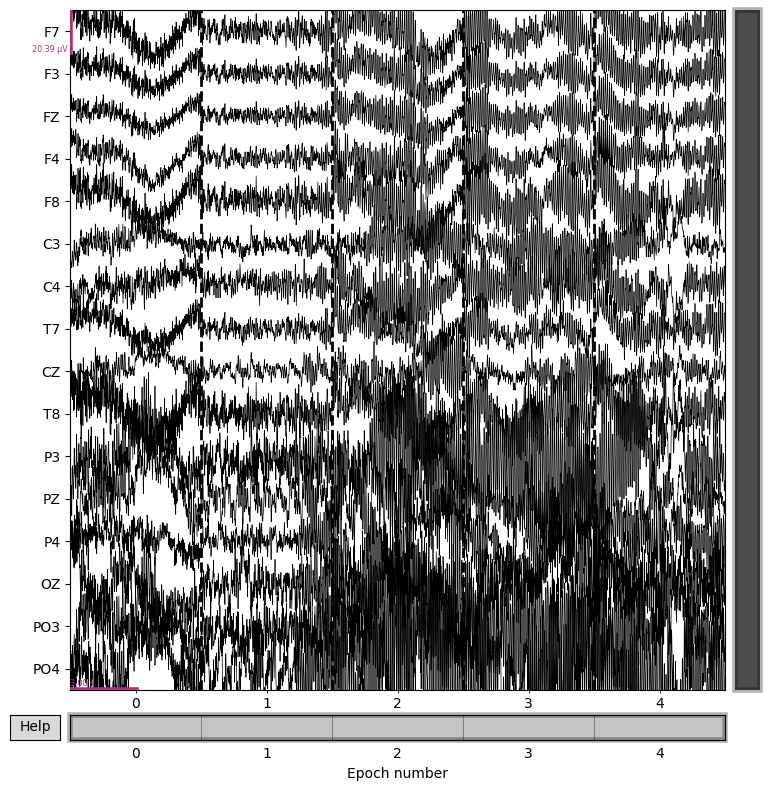

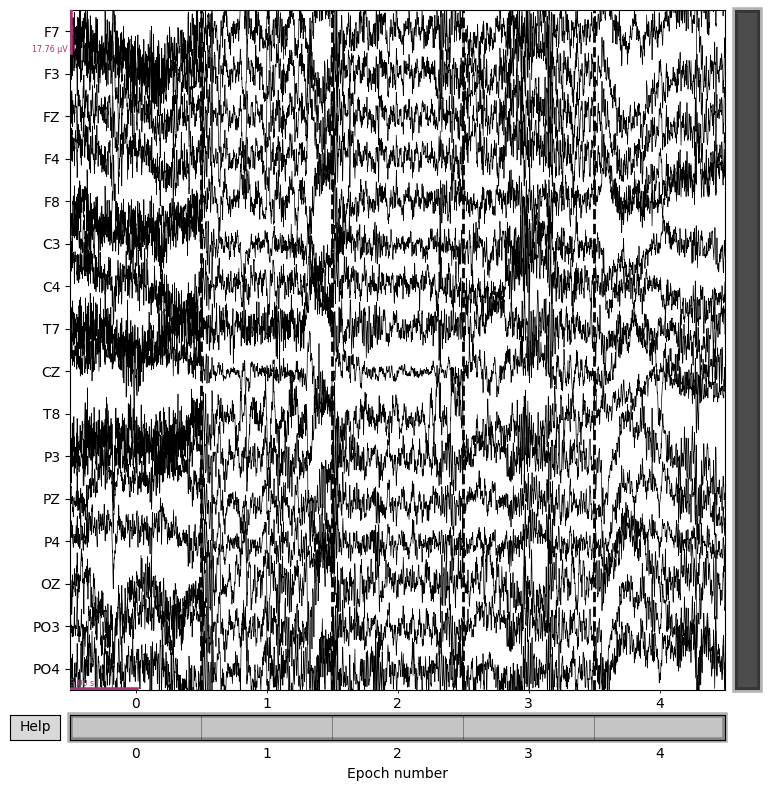

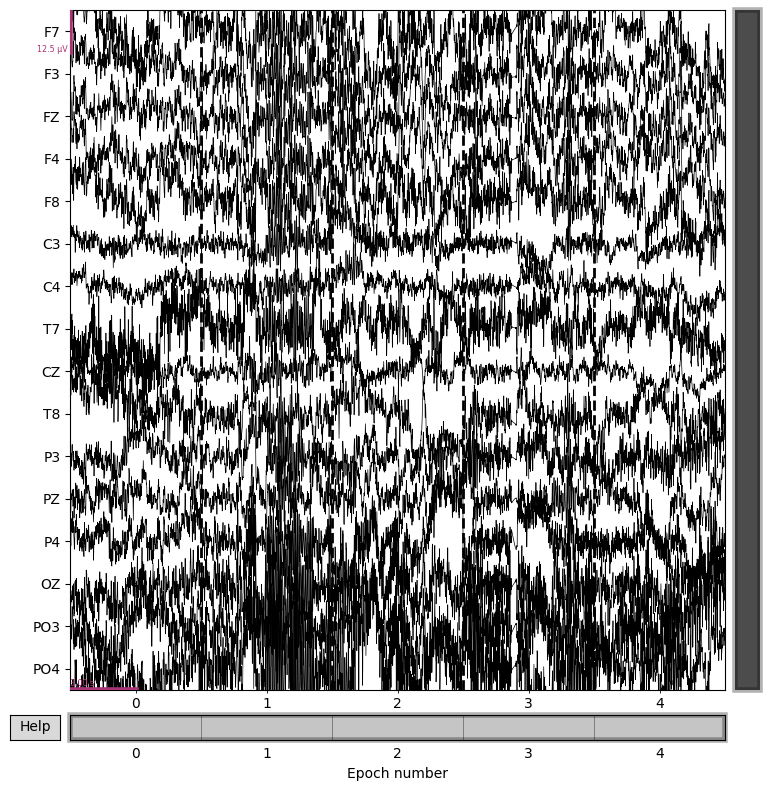

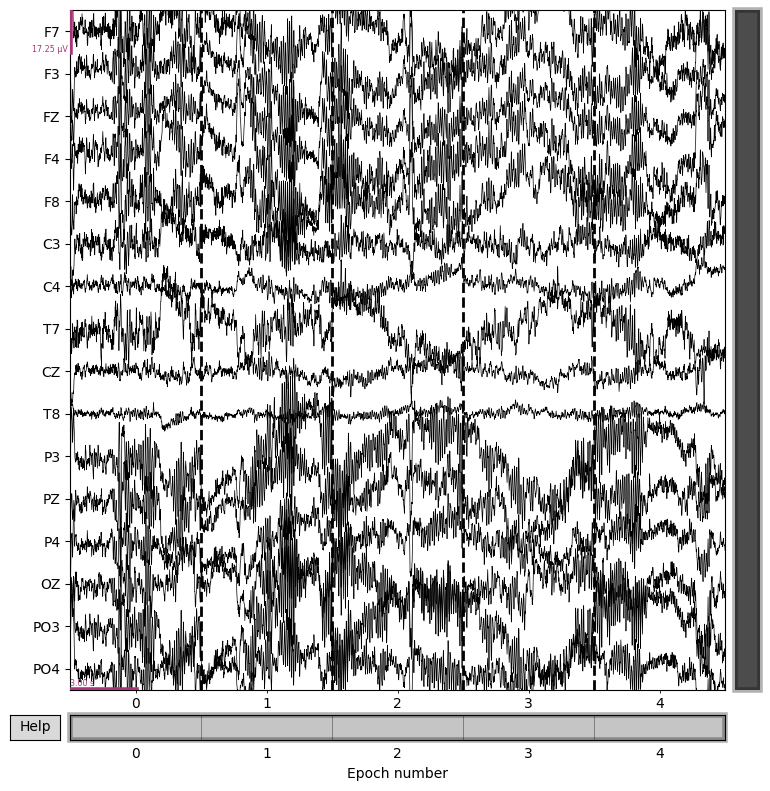

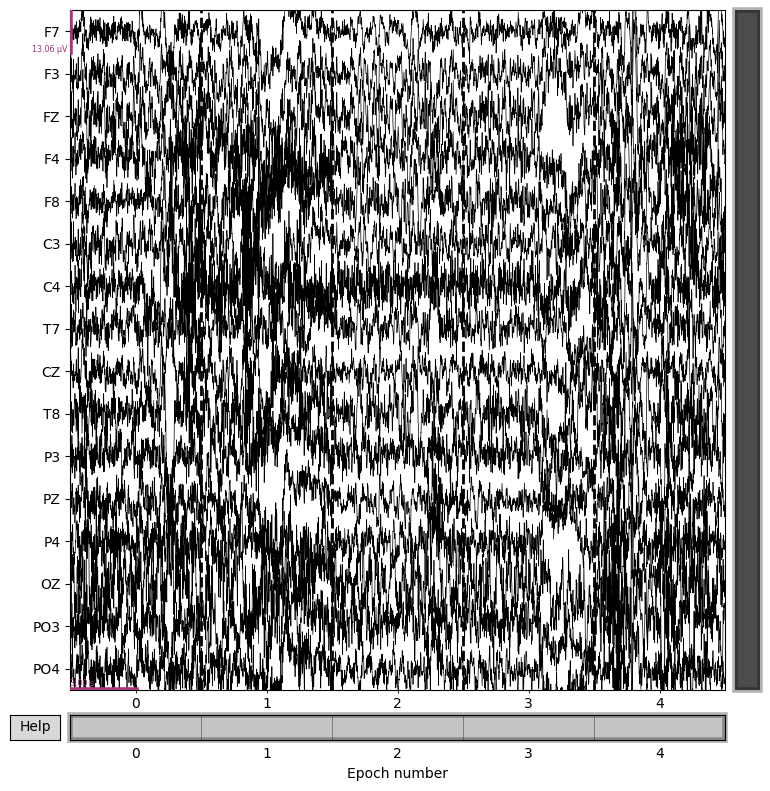

...

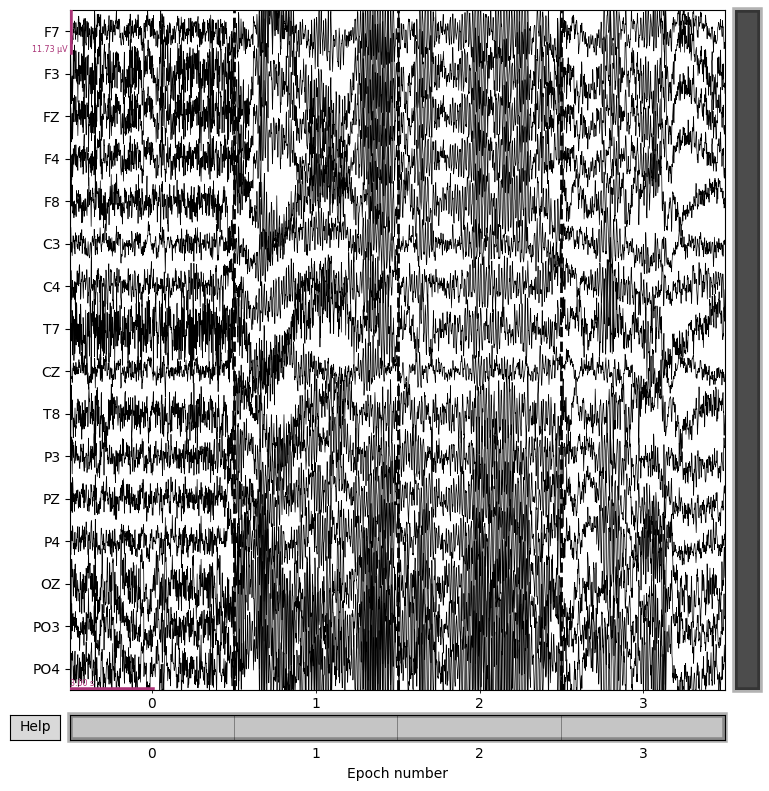

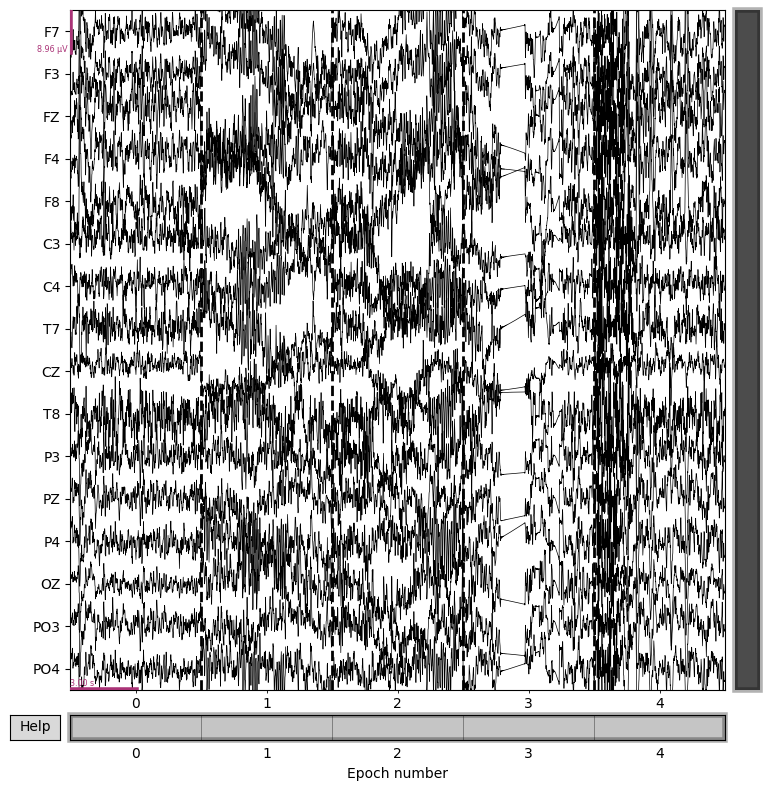

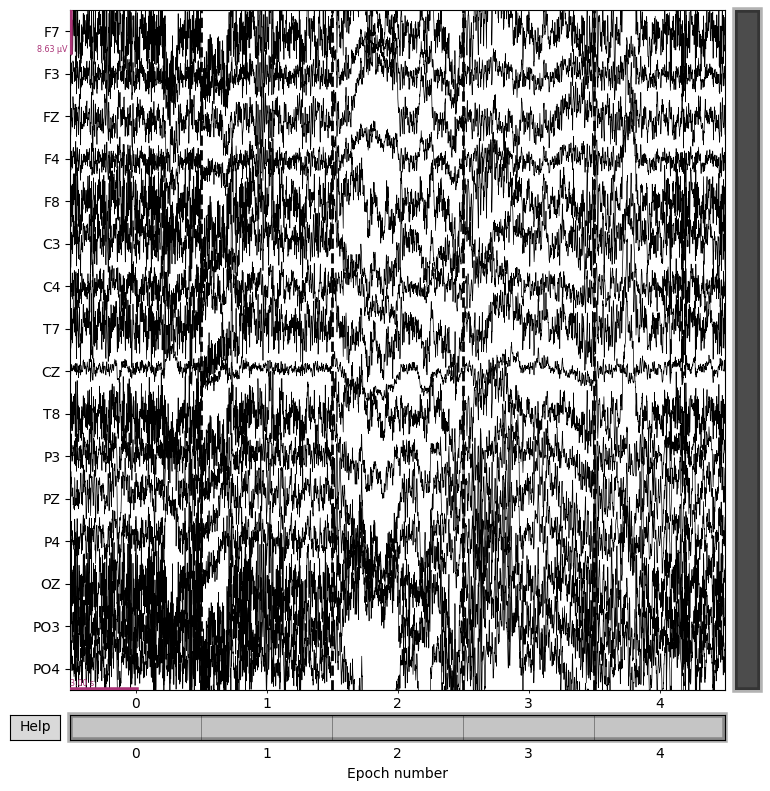

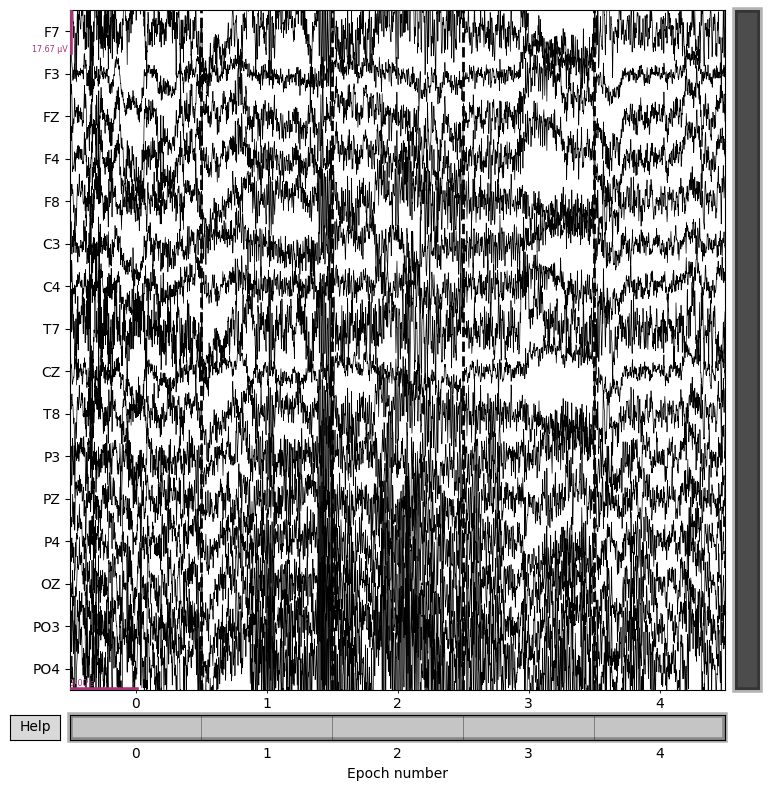

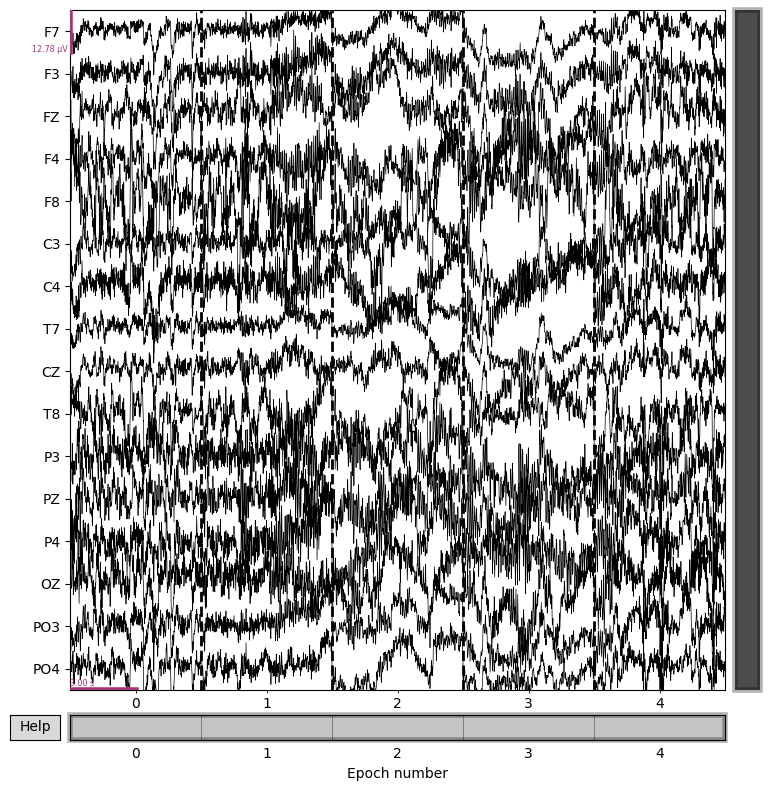

In [4]:
for key_tmp in data_dict:
    epochs = data_dict[key_tmp]["epochs"]
    fig = epochs.plot(scalings="auto", show=False)
    plt.savefig(
        f"{out_dir}data-viz_{key_tmp}.png",
        dpi=300,
        bbox_inches="tight",
        facecolor="white",
    )

## Plotting average epochs per channel in different condition

In [5]:
%matplotlib inline

rce = epochs["1"]
ind1 = epochs["2"]
ind2 = epochs["3"]
nh = epochs["4"]
pnh = epochs["5"]
chs = 16

for ch in range(chs):
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.set_xlabel("Time Instances")
    ax.set_ylabel("Volt")

    data = data_dict[key_tmp]["epochs data"]

    ax.plot(rce.average().data[ch, :], color="blue", label="Relax closed eyes")
    ax.plot(ind1.average().data[ch, :], color="red", label="Induction 1")
    ax.plot(ind2.average().data[ch, :], color="green", label="Induction 2")
    ax.plot(nh.average().data[ch, :], color="purple", label="Neutral hypnosis")
    ax.plot(pnh.average().data[ch, :], color="grey", label="Post NH")

    legend = ax.legend(loc="upper right", shadow=True, fontsize="medium")
    plt.title("ERP of different conditions_" + str(ch) + ":")
    plt.savefig(
        f"{out_dir}average-epoch_{ch}.png",
        dpi=300,
        bbox_inches="tight",
        facecolor="white",
    )
    plt.close()

#